In [8]:
from typing import Iterable
import warnings

import numpy as np

warnings.simplefilter(action='ignore', category=FutureWarning)

from edgedroid.models.timings import *
logger.enable("edgedroid")

import itertools as it
from collections import deque

import multiprocess as mp
import tqdm.notebook as tqdm

def run_model_against_ttfs(rep: int, model: ExecutionTimeModel, ttfs: Iterable[float]) -> pd.DataFrame:
    duration = 0.0
    rows = deque()
    prev_ttf = 0.0
    
    for step, ttf in enumerate(ttfs):
        execution_time = model.get_execution_time()
        # rtt = ttf / 1.5
        
        step_time = execution_time + ttf
        duration += step_time
        rows.append({
            "rep": rep,
            "step": step,
            "prev_ttf": prev_ttf,
            "ttf": ttf,
            # "rtt": rtt,
            "execution_time": execution_time,
            "step_time": step_time,
            "duration": duration
        })
        
        model.advance(ttf)
        prev_ttf = ttf
        
    return pd.DataFrame(rows)

def eval_model(
        rep: int, 
        model_name_const: Tuple[str, Callable[[float], ExecutionTimeModel]],
        neuro: float, 
        ttfs: Iterable[float]
) -> pd.DataFrame:
    model_name, model_constructor = model_name_const
    model = model_constructor(neuro)
    model_result = run_model_against_ttfs(rep, model, ttfs)
    model_result["model"] = model_name
    model_result["neuroticism"] = neuro
    model_result["rep"] = rep
    return model_result


class CubicETM(MultiCurveFittingExecutionTimeModel):
    _fit_functions = (CubeFit, )

reps = 40
num_steps = 100
ttfs = [[t] * 100 for t in (0.0, 1.0, 2.0, 3.0)]
neuroticism = (0.0, 1.0)
models = {
    "multicurve": lambda neuro: MultiCurveFittingExecutionTimeModel(neuroticism=neuro),
    "cubic": lambda neuro: CubicETM(neuroticism=neuro),
    "1st order median": lambda neuro: FirstOrderAggregateETM(aggregate_fn=np.median),
    "1st order emp. dist.": lambda neuro: FirstOrderETM(),
    "legacy": lambda neuro: LegacyModel()
}

with mp.Pool() as pool:
    futures = deque()
    for params in it.product(range(reps), models.items(), neuroticism, ttfs):
        futures.append(pool.apply_async(eval_model, params))
        
    dfs = deque(maxlen=len(futures))
    for fut in tqdm.tqdm(futures):
        dfs.append(fut.get())

results = pd.concat(dfs)
results

2024-03-03 18:31:08.275 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:08.274 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:08.277 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:08.273 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:08.274 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:08.279 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:08.279 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to

  0%|          | 0/1600 [00:00<?, ?it/s]

2024-03-03 18:31:08.716 | INFO     | edgedroid.models.timings.curve:__init__:155 - New best fit function for duration [5.0, 9.0): a * x^b + c (MSE: 0.09, prev. MSE 0.09)
2024-03-03 18:31:08.718 | INFO     | edgedroid.models.timings.curve:__init__:155 - New best fit function for duration [9.0, inf): a * x^b + c (MSE: 0.05, prev. MSE 0.05)
2024-03-03 18:31:08.724 | INFO     | edgedroid.models.timings.curve:__init__:155 - New best fit function for duration [9.0, inf): a * x^2 + b * x + c (MSE: 0.04, prev. MSE 0.04)
2024-03-03 18:31:08.726 | INFO     | edgedroid.models.timings.curve:__init__:155 - New best fit function for duration [5.0, 9.0): a * x^3 + b * x^2 + c * x + d (MSE: 0.07, prev. MSE 0.07)
2024-03-03 18:31:08.732 | INFO     | edgedroid.models.timings.curve:__init__:155 - New best fit function for duration [9.0, inf): a * x^3 + b * x^2 + c * x + d (MSE: 0.04, prev. MSE 0.04)
2024-03-03 18:31:08.738 | INFO     | edgedroid.models.timings.curve:__init__:155 - New best fit function f

,rep,step,prev_ttf,ttf,execution_time,step_time,duration,model,neuroticism
0,0,0,0.0,0.0,4.862317,4.862317,4.862317,multicurve,0.0
1,0,1,0.0,0.0,4.862317,4.862317,9.724635,multicurve,0.0
2,0,2,0.0,0.0,4.862317,4.862317,14.586952,multicurve,0.0
3,0,3,0.0,0.0,4.862317,4.862317,19.449270,multicurve,0.0
4,0,4,0.0,0.0,4.227849,4.227849,23.677118,multicurve,0.0
...,...,...,...,...,...,...,...,...,...
95,39,95,3.0,3.0,4.049000,7.049000,677.093000,legacy,1.0
96,39,96,3.0,3.0,4.049000,7.049000,684.142000,legacy,1.0
97,39,97,3.0,3.0,4.049000,7.049000,691.191000,legacy,1.0
98,39,98,3.0,3.0,4.049000,7.049000,698.240000,legacy,1.0


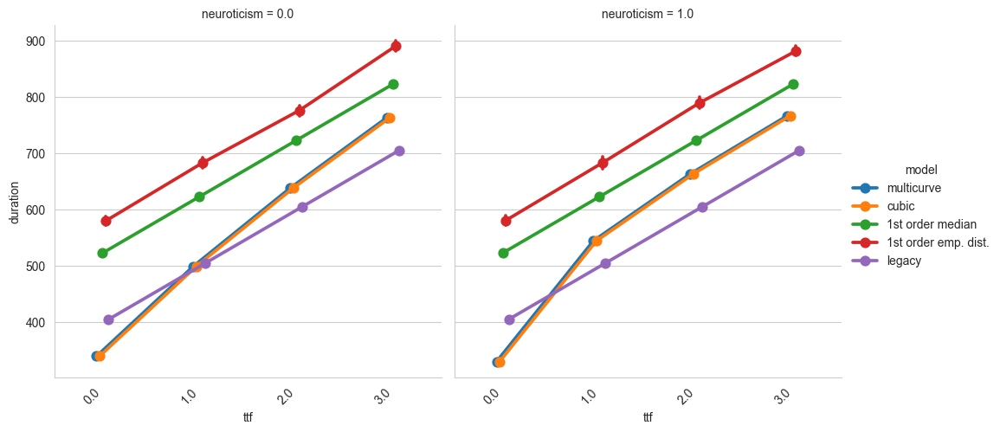

In [9]:
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns

fg = sns.catplot(
    kind="point",
    data=results.query("step == 99"),
    x="ttf",
    y="duration",
    hue="model",
    dodge=True,
    col="neuroticism",
)
for ax in fg.axes.flat:
    ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')
plt.show()
plt.close()

In [10]:
# autoregressive series of ttfs
# gaussian, turncated gaussien
# more extreme coeficients
# docker integration run with network parameters

def autoreg_ttfs(scale: float, autoreg_coef: float, num_steps: int=100):
    rng = np.random.default_rng()
    ttfs = np.zeros(num_steps, dtype=np.float64)
    ttfs[0] = rng.random() * scale
    
    for i in range(num_steps - 1):
        ttfs[i + 1] = (ttfs[i] * autoreg_coef) + (rng.random() * scale * (1.0 - autoreg_coef))
        
    return ttfs

In [11]:
import multiprocess as mp

autoreg_scales = (0.5, 1.0, 2.0, 4.0)
autoreg_coefs = (0.00, 0.25, 0.5, 0.75, 1.0)

total_evals = len(autoreg_scales) * len(autoreg_coefs) * reps * len(models) * len(neuroticism)

with mp.Pool() as pool, tqdm.tqdm(total=total_evals) as pbar:
    dfs = deque()
    
    for scale, coef in it.product(autoreg_scales, autoreg_coefs):
        futures = deque()
        
        ttfs = autoreg_ttfs(scale, coef)
        for params in it.product(range(reps), models.items(), neuroticism, [ttfs]):
            futures.append(pool.apply_async(eval_model, params))
        
        for fut in futures:
            fut_df = fut.get()
            fut_df["scale"] = scale
            fut_df["coef"] = coef
            dfs.append(fut_df)
            pbar.update(1)
            
results = pd.concat(dfs)
results

  0%|          | 0/8000 [00:00<?, ?it/s]

2024-03-03 18:31:22.811 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:22.810 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:22.812 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:22.812 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:23.043 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:23.049 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 18:31:23.063 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to

,rep,step,prev_ttf,ttf,execution_time,step_time,duration,model,neuroticism,scale,coef
0,0,0,0.000000,0.249668,4.862317,5.111985,5.111985,multicurve,0.0,0.5,0.0
1,0,1,0.249668,0.407567,5.009024,5.416591,10.528576,multicurve,0.0,0.5,0.0
2,0,2,0.407567,0.445258,5.082755,5.528013,16.056590,multicurve,0.0,0.5,0.0
3,0,3,0.445258,0.197922,5.098349,5.296271,21.352861,multicurve,0.0,0.5,0.0
4,0,4,0.197922,0.304153,4.364369,4.668522,26.021383,multicurve,0.0,0.5,0.0
...,...,...,...,...,...,...,...,...,...,...,...
95,39,95,2.239925,2.239925,4.049000,6.288925,604.125818,legacy,1.0,4.0,1.0
96,39,96,2.239925,2.239925,4.049000,6.288925,610.414744,legacy,1.0,4.0,1.0
97,39,97,2.239925,2.239925,4.049000,6.288925,616.703669,legacy,1.0,4.0,1.0
98,39,98,2.239925,2.239925,4.049000,6.288925,622.992594,legacy,1.0,4.0,1.0


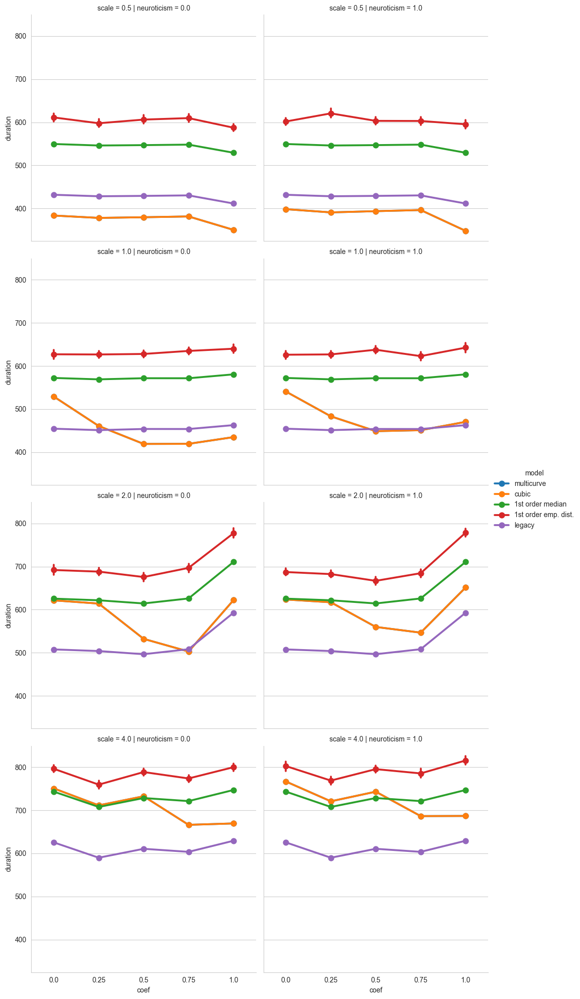

In [12]:
fg = sns.catplot(
    kind="point",
    data=results.query("step == 99"),
    hue="model",
    y="duration",
    x="coef",
    col="neuroticism",
    row="scale",
)
# for ax in fg.axes.flat:
#     ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')
# fg.fig.tight_layout()
plt.show()
plt.close()

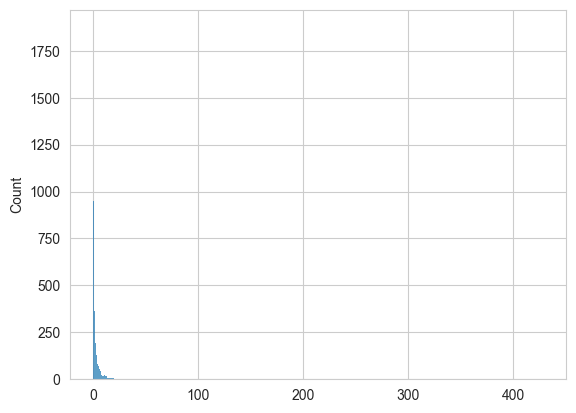

In [51]:
from scipy import stats

sns.histplot(stats.lognorm(s=1.6, loc=0.05).rvs(10000))
plt.show()

In [54]:
s_values = (0.05, 0.1, 0.2, 0.4, 0.8, 1.6)
locs = (0.05, 0.6, 1.2, 4.0)
total_evals = len(s_values) * len(locs) * reps * len(models) * len(neuroticism)

with mp.Pool() as pool, tqdm.tqdm(total=total_evals) as pbar:
    dfs = deque()

    for loc, s in it.product(locs, s_values):
        futures = deque()

        ttfs = stats.lognorm(s=s, loc=loc).rvs(100)
        for params in it.product(range(reps), models.items(), neuroticism, [ttfs]):
            futures.append(pool.apply_async(eval_model, params))

        for fut in futures:
            fut_df = fut.get()
            fut_df["loc"] = loc
            fut_df["s"] = s
            dfs.append(fut_df)
            pbar.update(1)

results = pd.concat(dfs)
results

  0%|          | 0/9600 [00:00<?, ?it/s]

2024-03-03 20:23:49.222 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 20:23:49.223 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 20:23:49.221 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 20:23:49.221 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 20:23:49.438 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 20:23:49.439 | DEBUG    | edgedroid.models.timings.curve:__init__:122 - Curve fitting aggregation function: outliers_to_nan_then_mean
2024-03-03 20:23:49.465 | INFO     | edgedroid.models.timings.curve:__init__:147 - Fitting execution time functions to data...
202

,rep,step,prev_ttf,ttf,execution_time,step_time,duration,model,neuroticism,loc,s
0,0,0,0.000000,1.027333,4.862317,5.889650,5.889650,multicurve,0.0,0.05,0.05
1,0,1,1.027333,1.110272,5.256117,6.366388,12.256038,multicurve,0.0,0.05,0.05
2,0,2,1.110272,1.030915,5.267984,6.298899,18.554938,multicurve,0.0,0.05,0.05
3,0,3,1.030915,1.110403,5.256675,6.367078,24.922016,multicurve,0.0,0.05,0.05
4,0,4,1.110403,1.026257,5.268001,6.294258,31.216274,multicurve,0.0,0.05,0.05
...,...,...,...,...,...,...,...,...,...,...,...
95,39,95,4.146292,5.421012,4.049000,9.470012,1059.587517,legacy,1.0,4.00,1.60
96,39,96,5.421012,5.499171,4.049000,9.548171,1069.135688,legacy,1.0,4.00,1.60
97,39,97,5.499171,8.805647,4.049000,12.854647,1081.990335,legacy,1.0,4.00,1.60
98,39,98,8.805647,36.253653,4.049000,40.302653,1122.292989,legacy,1.0,4.00,1.60


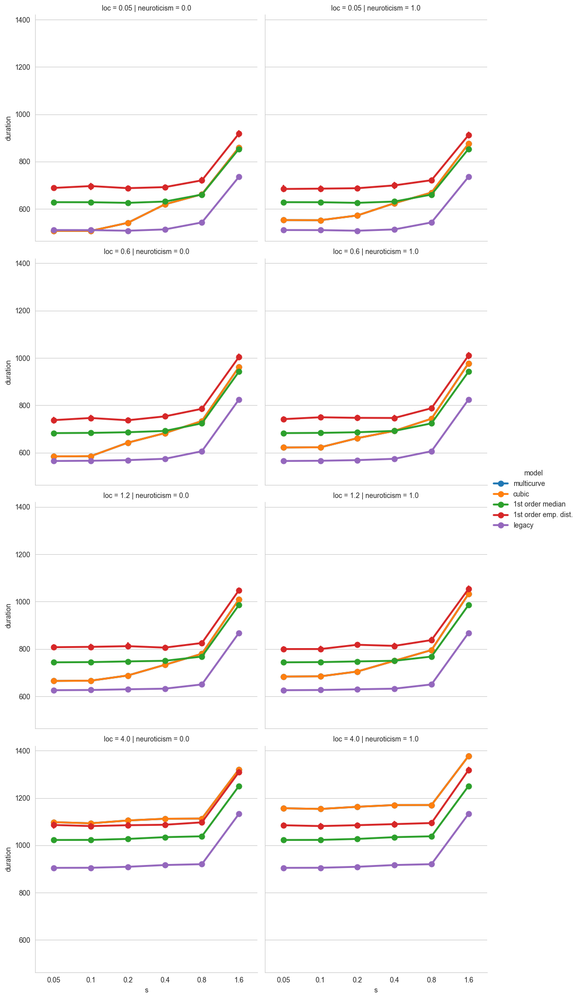

In [55]:
fg = sns.catplot(
    kind="point",
    data=results.query("step == 99"),
    hue="model",
    y="duration",
    x="s",
    col="neuroticism",
    row="loc",
)
# for ax in fg.axes.flat:
#     ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(), rotation=45, ha='right')
# fg.fig.tight_layout()
plt.show()
plt.close()